# 00 settings

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
from scipy.stats import pearsonr
from scipy import stats
from scipy import signal
import pymannkendall as mk

In [2]:
# path
res_path = 'xxx/data_analysis_res_m010/'
load_path = 'xxx/data_m010/'

res_path = 'F:/THU/anesthesia_light/data_analysis_res_m010/'
load_path = 'F:/THU/anesthesia_light/data_m010/'


print("res_path:", res_path)
print("load_path:", load_path)

# parameters
duration = 10
calc_start, calc_end = 2250, 3750

bs_time_range = [2310, 2340, 2370, 2420, 2453, 2486, 2554, 2596, 2688, 2713, \
             2766, 2916, 3012, 3072, 3130, 3282, 3402, 3581, 3661]
ane_time_range = [2296, 2330, 2358, 2396, 2439, 2475, 2526, 2656, 2746, 2846,\
             2976, 3036, 3096, 3196, 3256, 3316, 3446, 3616, 3716]

bs_ane_time_range = bs_time_range + ane_time_range
bs_ane_time_range.sort()
print("bs_ane_time_range:", len(bs_ane_time_range))

bs_time_idx = []
for i in bs_time_range:
    bs_time_idx.append(bs_ane_time_range.index(i))
print("bs_time_idx:", len(bs_time_idx), bs_time_idx[:5])   

ane_time_idx = []
for i in ane_time_range:
    ane_time_idx.append(bs_ane_time_range.index(i))
print("ane_time_idx:", len(ane_time_idx), ane_time_idx[:5])   

res_path: F:/THU/anesthesia_light/data_analysis_res_m010/
load_path: F:/THU/anesthesia_light/data_m010/
bs_ane_time_range: 38
bs_time_idx: 19 [1, 3, 5, 7, 9]
ane_time_idx: 19 [0, 2, 4, 6, 8]


# 01 load data

denoised_data: (17655, 9676)


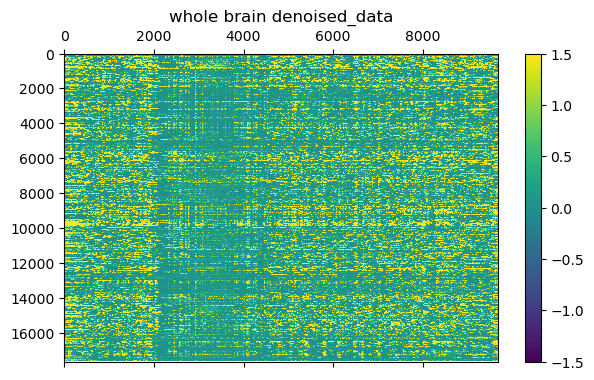

In [3]:
'''
calc data
'''
denoised_data = np.load(res_path + "records/neuron_denoised_records_whole_brain.npy")
print("denoised_data:", denoised_data.shape)

fig,ax = plt.subplots(figsize=(7,4), dpi=100,facecolor="w")
caxes = ax.matshow(denoised_data, vmin = -1.5, vmax = 1.5, cmap = "viridis", aspect = "auto")
fig.colorbar(caxes)
plt.title("whole brain denoised_data")
plt.show()

In [ ]:
valid_neuron_x = pd.read_csv(load_path + "valid_neuron_x.csv")
print("valid_neuron_x:", type(valid_neuron_x), valid_neuron_x.shape)
valid_neuron_x = valid_neuron_x.values

valid_neuron_y = pd.read_csv(load_path + "valid_neuron_y.csv")
print("valid_neuron_y:", type(valid_neuron_y), valid_neuron_y.shape)
valid_neuron_y = valid_neuron_y.values


# 02 burst neurons

select_data_ids: 13135 <class 'numpy.ndarray'>


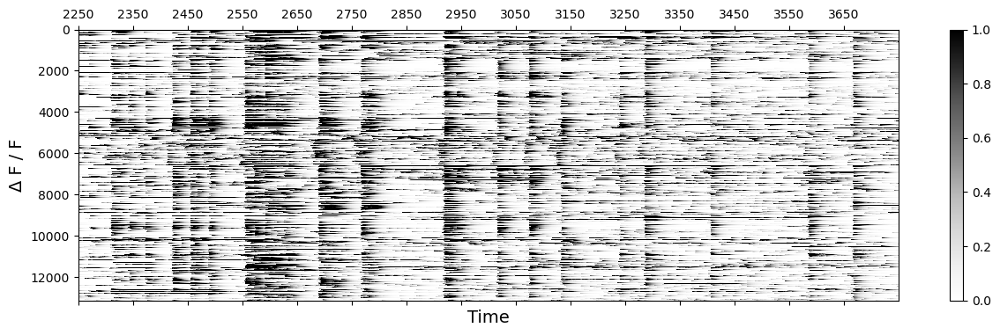

code_list: 13135
sort_id: 13135
sort_id: 13096
select_data_ids_sort: 13096
calc_rec: (13096, 1500)


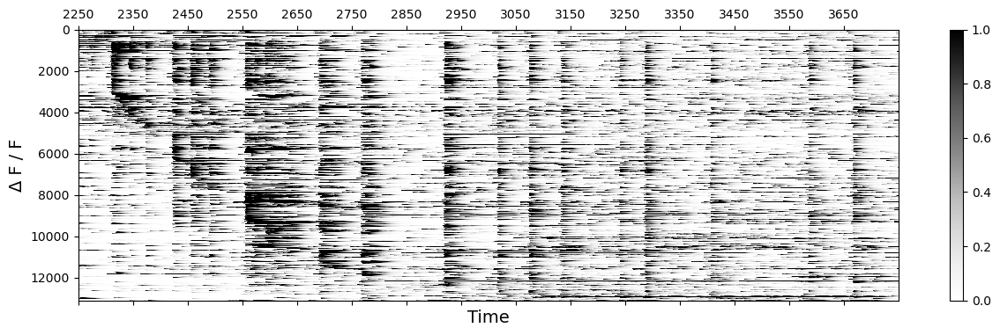

13096 38


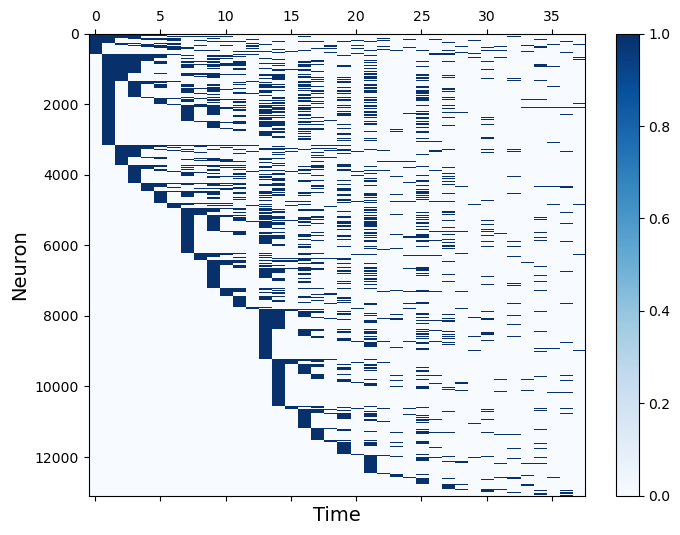

In [19]:
'''
burst neurons
'''
name = "burst"
select_data_ids = np.load(res_path + "neurons/neurons_ids_" + name + "_all_start_set_selfAvg_relax.npy")
print("select_data_ids:", len(select_data_ids), type(select_data_ids))

calc_rec = denoised_data[select_data_ids, calc_start : calc_end]
fig,ax = plt.subplots(figsize=(15,4), dpi=100, facecolor="w")
caxes = ax.matshow(calc_rec, vmin = 0, vmax = 1, cmap = "Greys", aspect = "auto")
fig.colorbar(caxes)
plt.xticks(np.arange(0, calc_end - calc_start, 100), np.arange(calc_start, calc_end, 100))
plt.ylabel("\u0394 F / F", fontsize = 14)
plt.xlabel("Time", fontsize = 14)
plt.show()


'''
sort burst neurons
'''
select_data_ids_dict = {}
for start in bs_ane_time_range:   
    if start in bs_time_range:
        select_data_ids_dict[start] = np.load(res_path + "neurons/neurons_ids_burst_start" + str(start) + "_duration" + str(duration) + "_selfAvg_relax.npy")
    else:
        select_data_ids_dict[start] = np.load(res_path + "neurons/neurons_ids_supp_start" + str(start) + "_duration" + str(duration) + "_selfAvg_relax.npy")
code_list = []
count_0 = 0
for neuron_i in select_data_ids:
    code = []
    for start in bs_ane_time_range:
        if neuron_i in select_data_ids_dict[start]:
            code.append(1)
        else:
            code.append(0)
    code_int = ''.join(str(i) for i in code)
    code_list.append(int(code_int))
    if int(code_int) == 0:
        count_0 += 1
print("code_list:", len(code_list))
sort_id = sorted(range(len(code_list)), key = lambda k: code_list[k], reverse = True)
print("sort_id:", len(sort_id))
sort_id = sort_id[0 : len(sort_id) - count_0]
print("sort_id:", len(sort_id))

select_data_ids_sort = [select_data_ids[i] for i in sort_id]
print("select_data_ids_sort:", len(select_data_ids_sort))

calc_rec = denoised_data[select_data_ids_sort, calc_start : calc_end]
print("calc_rec:", calc_rec.shape)

fig,ax = plt.subplots(figsize=(15,4), dpi=100, facecolor="w")
caxes = ax.matshow(calc_rec, vmin = 0, vmax = 1, cmap = "Greys", aspect = "auto")
fig.colorbar(caxes)
plt.xticks(np.arange(0, calc_end - calc_start, 100), np.arange(calc_start, calc_end, 100))
plt.ylabel("\u0394 F / F", fontsize = 14)
plt.xlabel("Time", fontsize = 14)
plt.show()
    
'''
burst code
'''

num = len(bs_ane_time_range)
code_matrix = np.zeros((len(sort_id), num))
for i in range(len(sort_id)):
    code = code_list[sort_id[i]]
    code_int_list = [int(j) for j in list(str(code))]
        
    for k in range(len(code_int_list)):
        int_idx = len(code_int_list) - k - 1
        matrix_idx = num - k - 1
        code_matrix[i,matrix_idx] = code_int_list[int_idx]
print(len(code_matrix), len(code_matrix[0]))

fig,ax = plt.subplots(figsize=(8,6), dpi=100, facecolor="w")
caxes = ax.matshow(code_matrix, vmin = 0, vmax = 1, cmap = "Blues", aspect = "auto")
fig.colorbar(caxes)
plt.ylabel("Neuron", fontsize = 14)
plt.xlabel("Time", fontsize = 14)
plt.show()


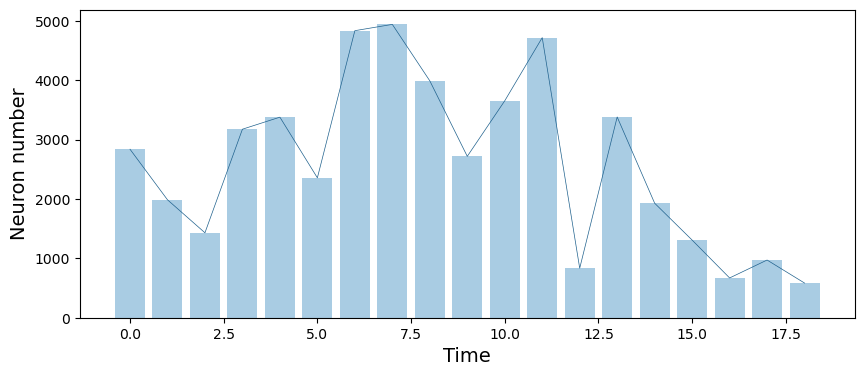

y: [0.14447159437996335, 0.14790775809407453, 0.14607513744654857, 0.11973121563836286, 0.1036957849725107, 0.0870494807574832, 0.07246487477092242, 0.05497861942577886, 0.041692119731215636, 0.03062003665241295, 0.02069334147831399, 0.014890042761148442, 0.007559560171044594, 0.00450519242516799, 0.0022907758094074526, 0.0013744654856444715]


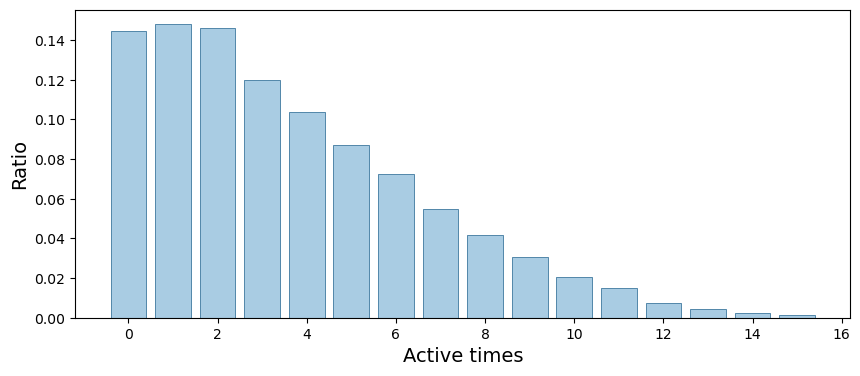

time 2310  -- selected neuron number: 2839


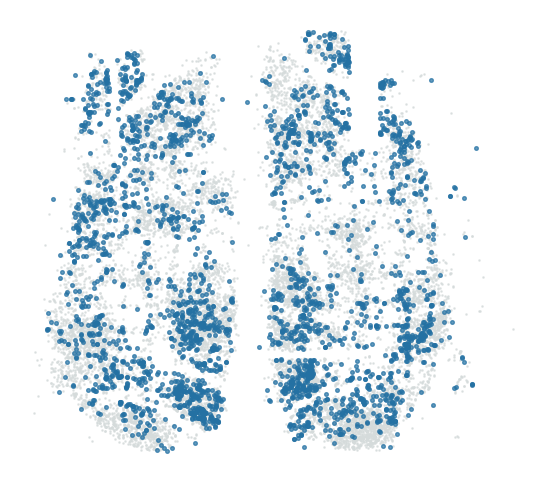

time 2340  -- selected neuron number: 1987


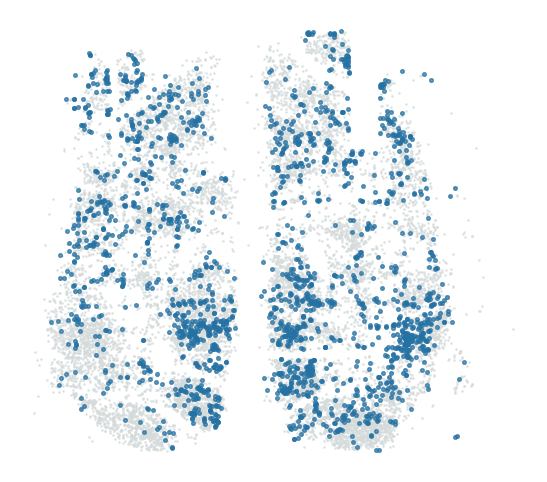

time 2370  -- selected neuron number: 1431


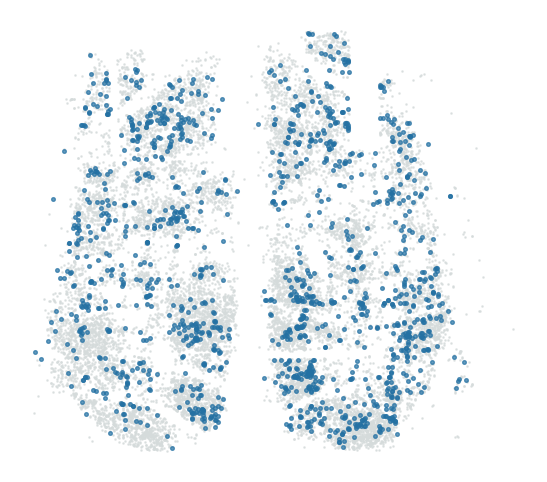

time 2420  -- selected neuron number: 3176


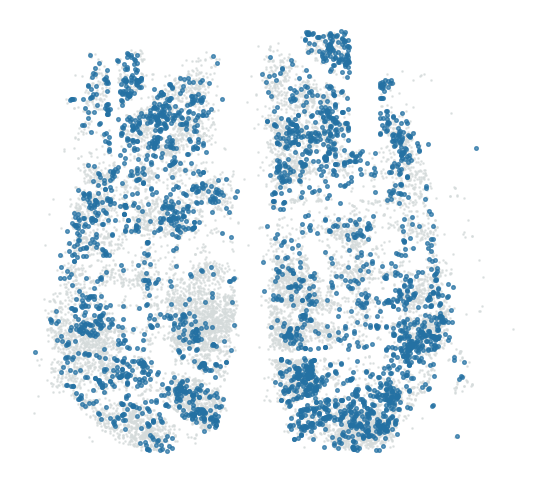

time 2453  -- selected neuron number: 3379


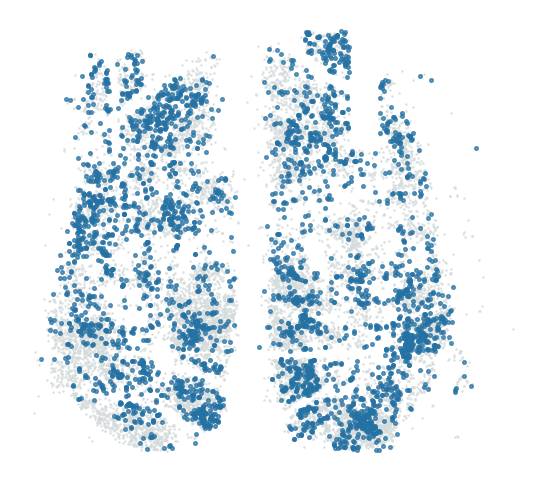

time 2486  -- selected neuron number: 2357


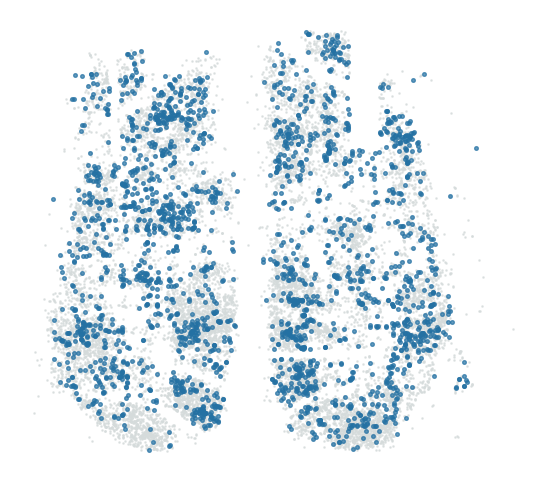

time 2554  -- selected neuron number: 4836


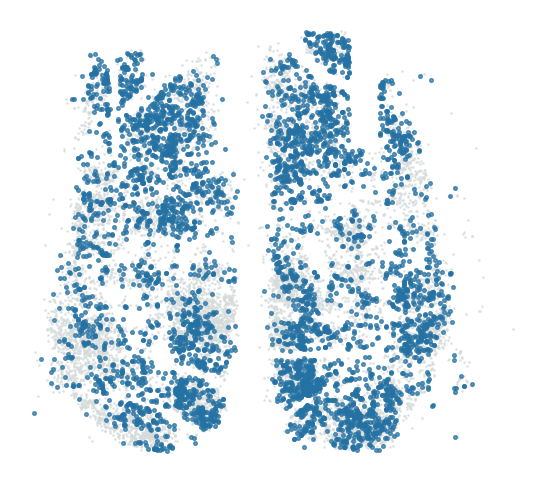

time 2596  -- selected neuron number: 4942


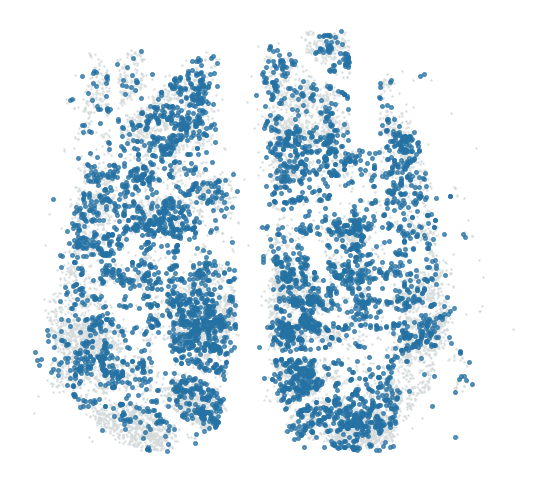

time 2688  -- selected neuron number: 3991


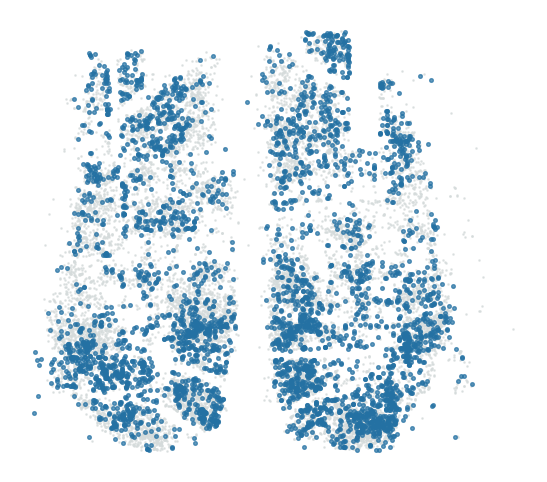

time 2713  -- selected neuron number: 2719


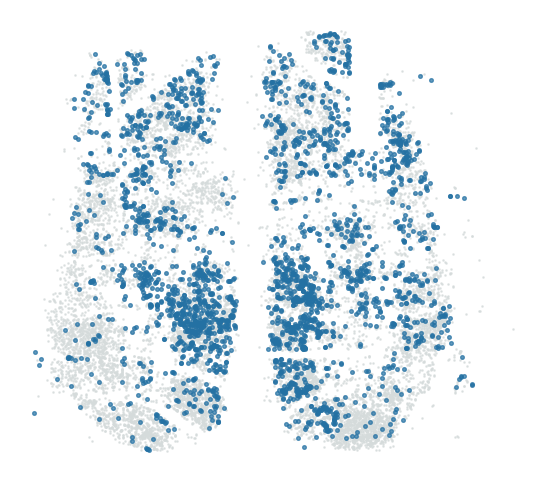

time 2766  -- selected neuron number: 3655


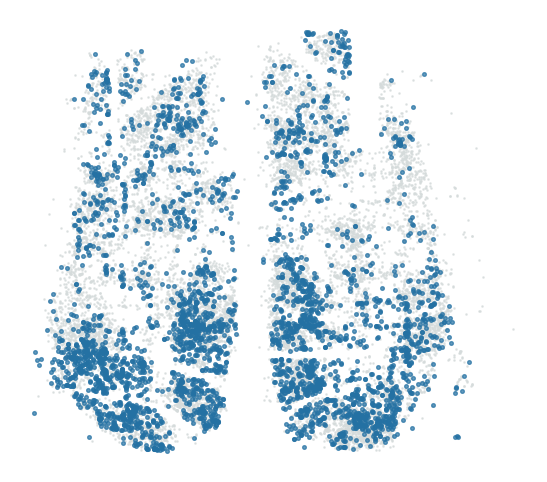

time 2916  -- selected neuron number: 4719


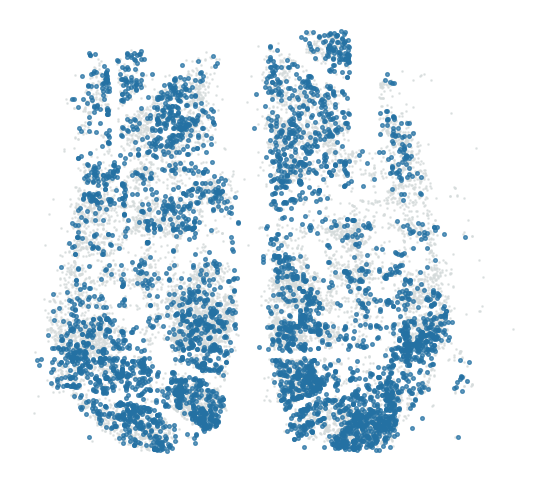

time 3012  -- selected neuron number: 834


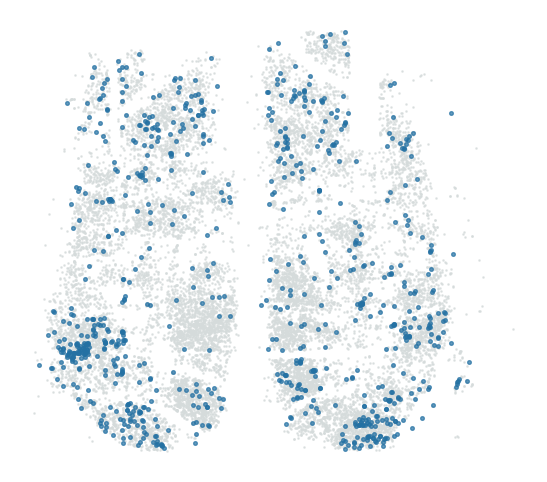

time 3072  -- selected neuron number: 3382


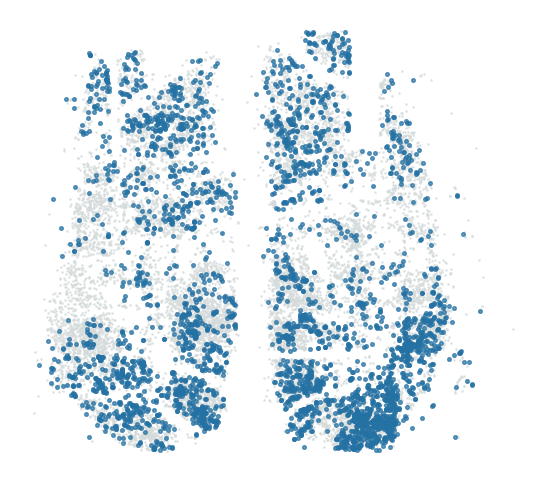

time 3130  -- selected neuron number: 1929


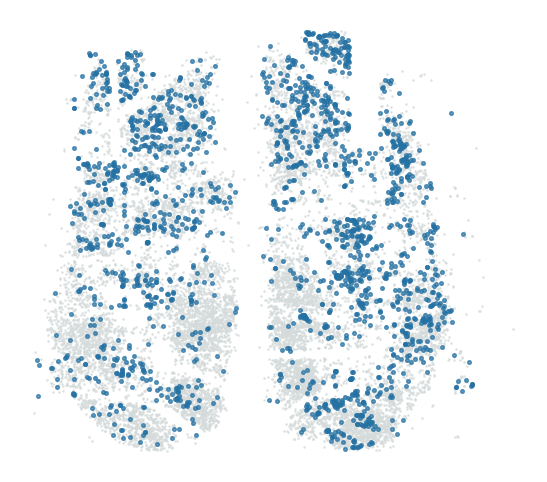

time 3282  -- selected neuron number: 1308


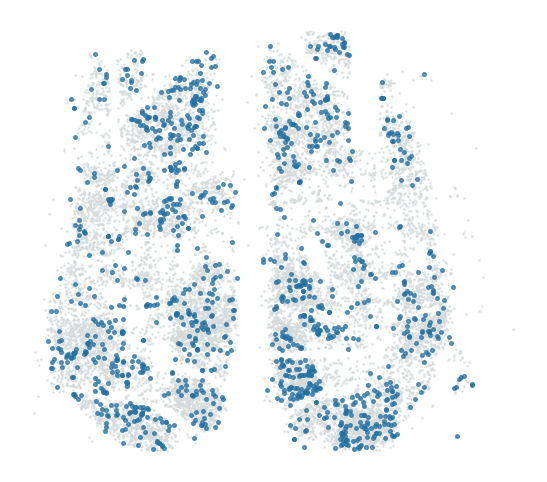

time 3402  -- selected neuron number: 670


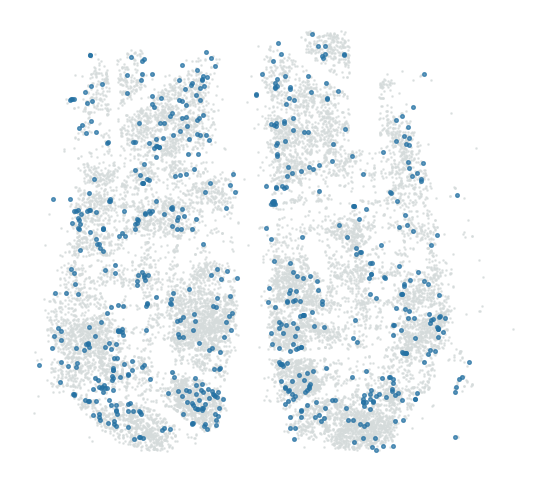

time 3581  -- selected neuron number: 972


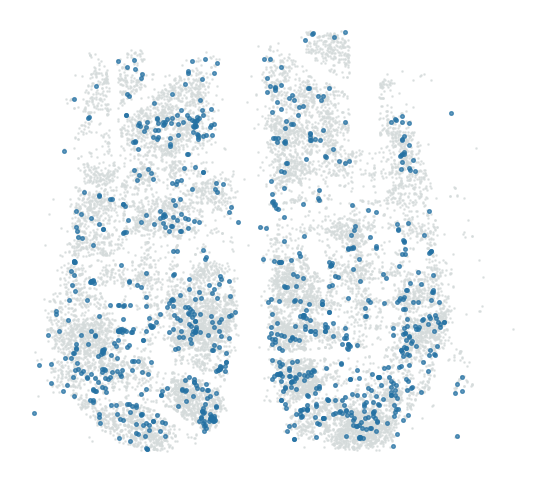

time 3661  -- selected neuron number: 584


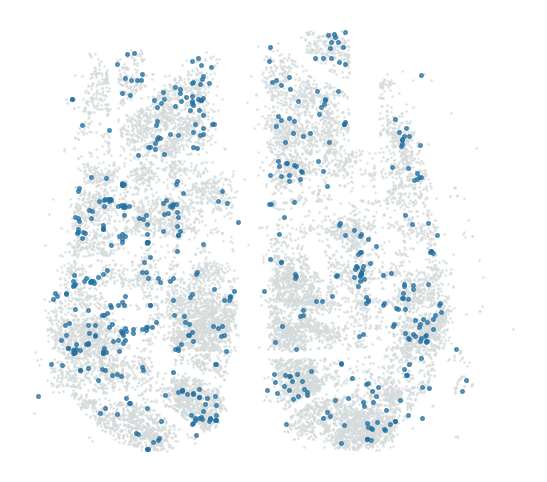

end


In [20]:
'''
statistics
'''

name = "burst"

## time evolution
bs_code_matrix_sum = np.sum(code_matrix, axis = 0)
bs_code_matrix_sum_bs = bs_code_matrix_sum[bs_time_idx]

x = range(len(bs_code_matrix_sum_bs))
fig,ax = plt.subplots(figsize=(10,4), dpi=100, facecolor="w")
plt.bar(x, bs_code_matrix_sum_bs, color = "#A9CCE3")
plt.plot(bs_code_matrix_sum_bs, "-", color = "#1F618D", linewidth = 0.5)
plt.xlabel("Time", fontsize = 14)
plt.ylabel("Neuron number", fontsize = 14)
plt.savefig(res_path + "neurons/neurons_active_code_selfAvg_only_" + name + ".pdf", bbox_inches='tight')
plt.show()


## active times
times_max = 16  ## change this parameter
code_matrix_type = np.sum(code_matrix, axis = 1)
code_matrix_type_cnt = []
for i in range(1, len(bs_code_matrix_sum_bs) + 1):
    cnt = list(code_matrix_type).count(i)
    code_matrix_type_cnt.append(cnt)

x = range(times_max)
y = [code_matrix_type_cnt[i] / sum(code_matrix_type_cnt) for i in range(times_max - 1)]
y.append(sum(code_matrix_type_cnt[times_max - 1:]) / sum(code_matrix_type_cnt))
print("y:", y)

fig,ax = plt.subplots(figsize=(10,4), dpi=100, facecolor="w")
plt.bar(x, y, color = "#A9CCE3", edgecolor = "#1F618D", linewidth = 0.5)
plt.ylabel("Ratio", fontsize = 14)
plt.xlabel("Active times", fontsize = 14)
# plt.xlim((-0.05, 650))
plt.savefig(res_path + "neurons/neurons_active_code_ratio_" + name + "_selfAvg.pdf", bbox_inches='tight')
plt.show()


## brain map 
cnt = 0
cnt_list = []
for start in bs_time_range:   
    select_data_ids = np.load(res_path + "neurons/neurons_ids_" + name + "_start" + str(start) + "_duration" + str(duration) + "_selfAvg_relax.npy")
    print("time", start, " -- selected neuron number:", len(select_data_ids))

    ## pos
    neurons_x_only = [valid_neuron_x[i] for i in select_data_ids]
    neurons_y_only = [valid_neuron_y[i] for i in select_data_ids]
    
    non_select_data_ids = [i for i in range(len(denoised_data)) if i not in select_data_ids]
    non_neurons_x = [valid_neuron_x[i] for i in non_select_data_ids]
    non_neurons_y = [valid_neuron_y[i] for i in non_select_data_ids]

    fig, ax = plt.subplots(figsize = (6.8, 6), dpi= 100,facecolor="w")
    plt.scatter(non_neurons_x, non_neurons_y, s = 0.8, c = "#D5DBDB", alpha = 0.7)
    plt.scatter(neurons_x_only, neurons_y_only, s = 7, c = "#2471A3", alpha = 0.7)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    plt.xticks([])
    plt.yticks([])
    plt.savefig(res_path + "neurons/neurons_map_" + name + "_start" + str(start) + "_duration" + str(duration) + "_selfAvg_relax.png", bbox_inches='tight')
    plt.show()
    
print("end")

only_bs_ids: 7432
bs_and_ane_ids: 5596
------------------ only-type neurons ----------------------


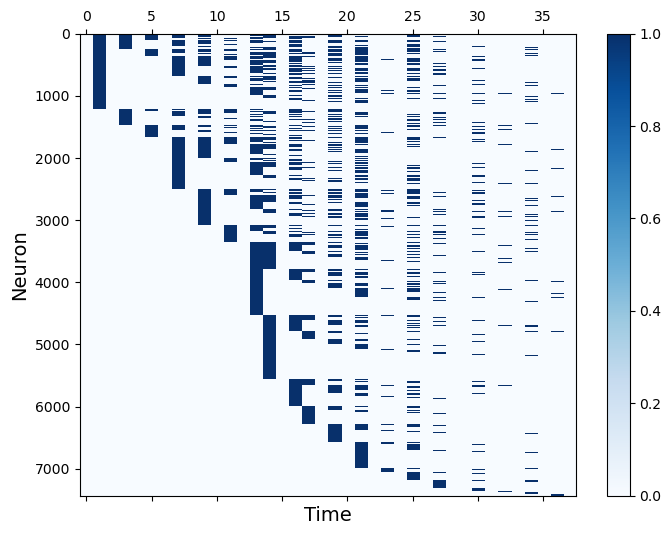

(7432,)


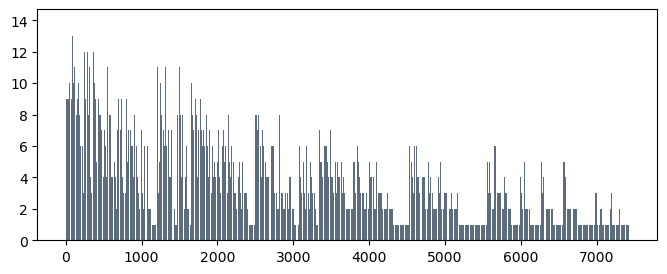

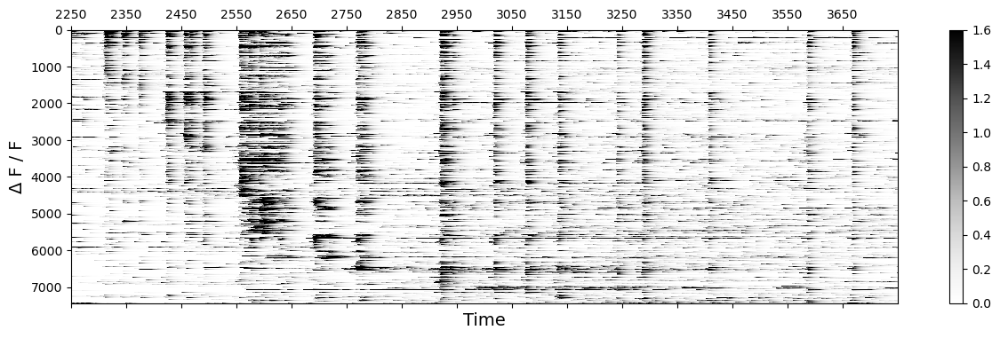

------------------ both-type neurons ----------------------


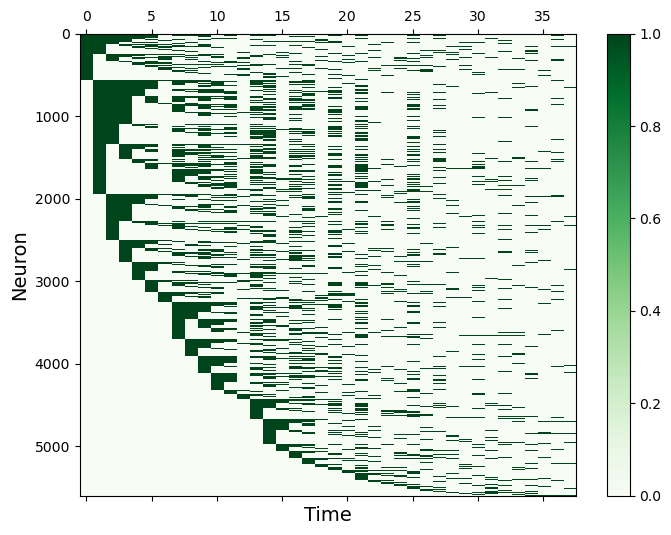

(5596,)


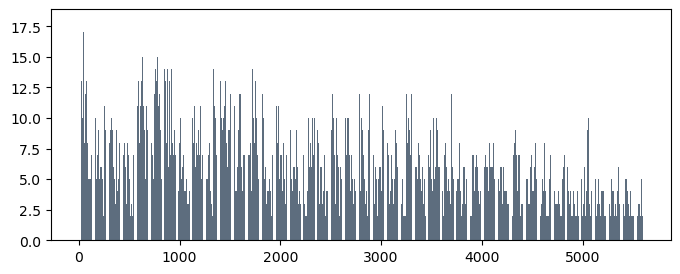

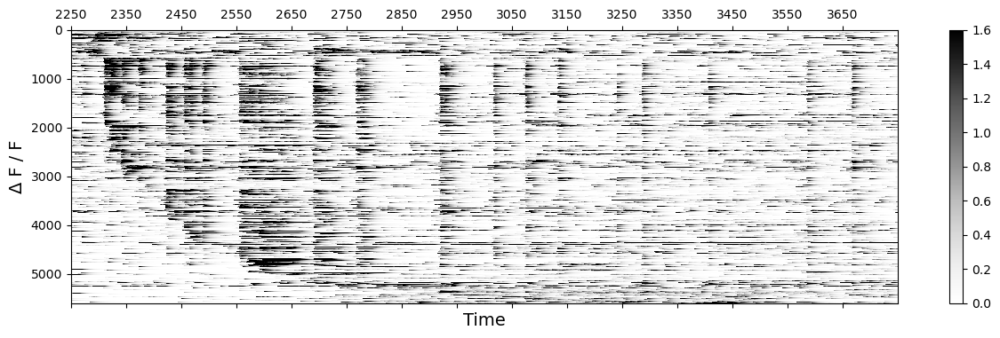

end


In [21]:
'''
detailed category
'''

name = "burst"

only_bs_ids = []
bs_and_ane_ids = []
for i in range(len(code_matrix)):
    active_idx = list(np.where(code_matrix[i] == 1)[0])
    ane_active_idx = list(set(active_idx) & set(ane_time_idx))
    bs_active_idx = list(set(active_idx) & set(bs_time_idx))
    if len(bs_active_idx) == 0:
        continue
    if len(ane_active_idx) == 0:
        only_bs_ids.append(i)
    else:
        bs_and_ane_ids.append(i)
print("only_bs_ids:", len(only_bs_ids)) 
print("bs_and_ane_ids:", len(bs_and_ane_ids)) 

## only burst
print("------------------ only-type neurons ----------------------")
code_matrix_only_bs = code_matrix[only_bs_ids]
fig,ax = plt.subplots(figsize=(8,6), dpi=100, facecolor="w")
caxes = ax.matshow(code_matrix_only_bs, vmin = 0, vmax = 1, cmap = "Blues", aspect = "auto")
fig.colorbar(caxes)
plt.ylabel("Neuron", fontsize = 14)
plt.xlabel("Time", fontsize = 14)
plt.savefig(res_path + "neurons/active_code_sorted_only_" + name + ".pdf", bbox_inches='tight')
plt.show()

code_matrix_sum_only_bs = np.sum(code_matrix_only_bs, axis = 1)
print(code_matrix_sum_only_bs.shape)
x = range(len(code_matrix_sum_only_bs))
fig,ax = plt.subplots(figsize=(8,3), dpi=100, facecolor="w")
plt.bar(x, code_matrix_sum_only_bs,color = "#5D6D7E", width = 0.8)
plt.savefig(res_path + "neurons/active_times_only_" + name + ".pdf", bbox_inches='tight')
plt.show()

data_only_bs_ids = [select_data_ids_sort[i] for i in only_bs_ids]
calc_rec_only_bs = denoised_data[data_only_bs_ids, calc_start : calc_end]
fig,ax = plt.subplots(figsize=(15,4), dpi=100, facecolor="w")
caxes = ax.matshow(calc_rec_only_bs, vmin = 0, vmax = 1.6, cmap = "Greys", aspect = "auto")
fig.colorbar(caxes)
plt.xticks(np.arange(0, calc_end - calc_start, 100), np.arange(calc_start, calc_end, 100))
plt.ylabel("\u0394 F / F", fontsize = 14)
plt.xlabel("Time", fontsize = 14)
plt.savefig(res_path + "neurons/calc_trace_sorted_only_" + name + ".pdf", bbox_inches='tight')
plt.show()

np.save(res_path + "neurons/neurons_only_" + name + "_ids.npy", data_only_bs_ids)


## both burst and supp
print("------------------ both-type neurons ----------------------")
code_matrix_bs_ane = code_matrix[bs_and_ane_ids]
fig,ax = plt.subplots(figsize=(8,6), dpi=100, facecolor="w")
caxes = ax.matshow(code_matrix_bs_ane, vmin = 0, vmax = 1, cmap = "Greens", aspect = "auto")
fig.colorbar(caxes)
plt.ylabel("Neuron", fontsize = 14)
plt.xlabel("Time", fontsize = 14)
plt.savefig(res_path + "neurons/active_code_sorted_both_burst_supp.pdf", bbox_inches='tight')
plt.show()

code_matrix_sum_bs_ane = np.sum(code_matrix_bs_ane, axis = 1)
print(code_matrix_sum_bs_ane.shape)
x = range(len(code_matrix_sum_bs_ane))
fig,ax = plt.subplots(figsize=(8,3), dpi=100, facecolor="w")
plt.bar(x, code_matrix_sum_bs_ane,color = "#5D6D7E", width = 0.8)
plt.savefig(res_path + "neurons/active_times_both_burst_supp.pdf", bbox_inches='tight')
plt.show()

bs_ane_ids = [select_data_ids_sort[i] for i in bs_and_ane_ids]
calc_rec_bs_ane = denoised_data[bs_ane_ids, calc_start : calc_end]
# calc_rec = denoised_data[select_data_ids_sort, calc_start : calc_end]
# calc_rec_bs_ane = calc_rec[bs_and_ane_ids]
fig,ax = plt.subplots(figsize=(15,4), dpi=100, facecolor="w")
caxes = ax.matshow(calc_rec_bs_ane, vmin = 0, vmax = 1.6, cmap = "Greys", aspect = "auto")
fig.colorbar(caxes)
plt.xticks(np.arange(0, calc_end - calc_start, 100), np.arange(calc_start, calc_end, 100))
plt.ylabel("\u0394 F / F", fontsize = 14)
plt.xlabel("Time", fontsize = 14)
plt.savefig(res_path + "neurons/calc_trace_sorted_both_burst_supp.pdf", bbox_inches='tight')
plt.show()

np.save(res_path + "neurons/neurons_both_burst_supp_ids.npy", bs_ane_ids)

print("end")


code_matrix_only_bs_sum_bs: (19,)


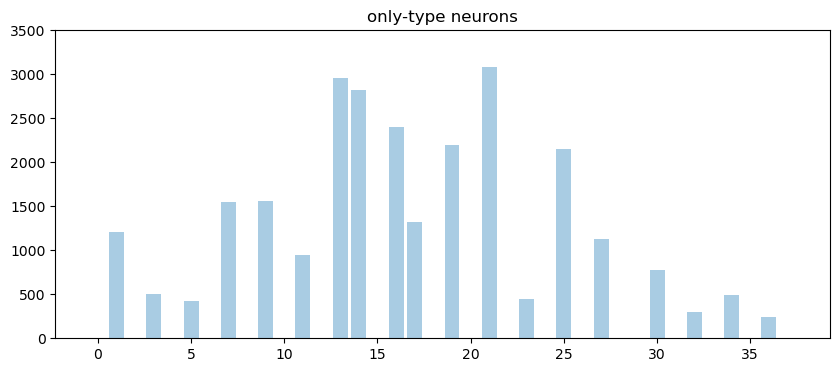

code_matrix_bs_ane_sum_bs_all: (38,)


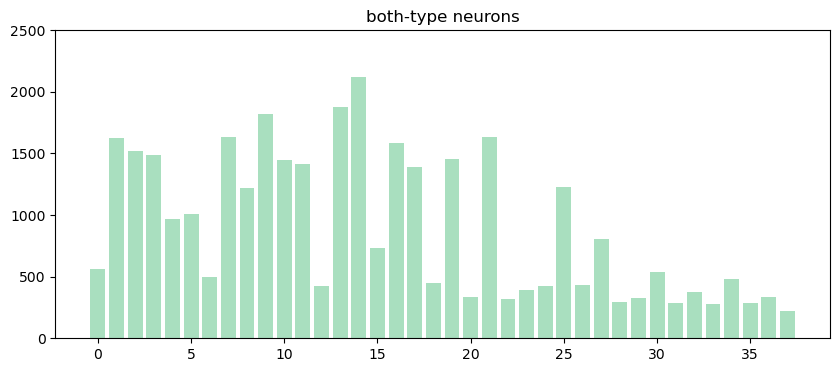

In [23]:
'''
further statistics
'''

## only-type neurons along time
code_matrix_only_bs_sum = np.sum(code_matrix_only_bs, axis = 0)
code_matrix_only_bs_sum_bs = code_matrix_only_bs_sum[bs_time_idx]
print("code_matrix_only_bs_sum_bs:", code_matrix_only_bs_sum_bs.shape)

data = [0] * len(bs_ane_time_range)
for i in range(len(bs_time_idx)):
    data[bs_time_idx[i]] = code_matrix_only_bs_sum_bs[i]
    
x = range(len(data))
fig,ax = plt.subplots(figsize=(10,4), dpi=100, facecolor="w")
plt.bar(x, data, color = "#A9CCE3")#, edgecolor = "#2471A3")
plt.ylim((0,3500))
plt.title("only-type neurons")
plt.savefig(res_path + "neurons/neurons_active_code_selfAvg_only_burst.pdf", bbox_inches='tight')
plt.show()

## both-type neurons along time 
code_matrix_bs_ane_sum = np.sum(code_matrix_bs_ane, axis = 0)
code_matrix_bs_ane_sum_bs_all = code_matrix_bs_ane_sum
print("code_matrix_bs_ane_sum_bs_all:", code_matrix_bs_ane_sum_bs_all.shape)

x = range(len(code_matrix_bs_ane_sum_bs_all))
fig,ax = plt.subplots(figsize=(10,4), dpi=100, facecolor="w")
plt.bar(x, code_matrix_bs_ane_sum_bs_all, color = "#A9DFBF")
plt.ylim((0,2500))
plt.title("both-type neurons")
plt.savefig(res_path + "neurons/neurons_active_code_selfAvg_both_burst_supp.pdf", bbox_inches='tight')
plt.show()



# 03 supp neurons

select_data_ids: 7641 <class 'numpy.ndarray'>


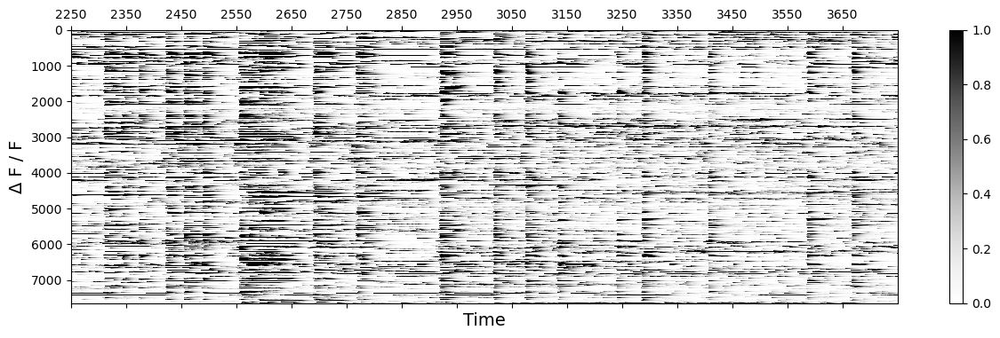

code_list: 7641
sort_id: 7641
sort_id: 7596
select_data_ids_sort: 7596
calc_rec: (7596, 1500)


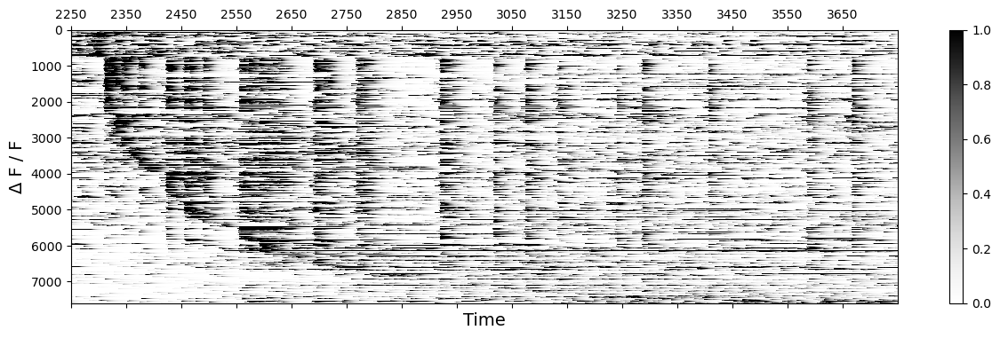

7596 38


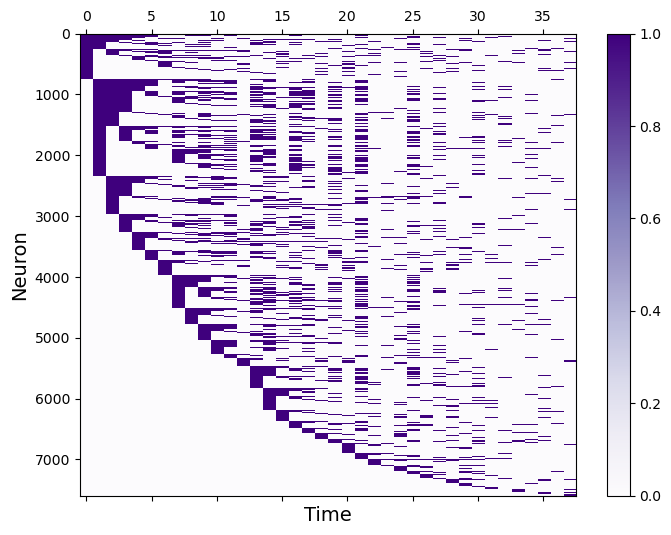

In [24]:
'''
supp neurons
'''
name = "supp"
select_data_ids = np.load(res_path + "neurons/neurons_ids_" + name + "_all_start_set_selfAvg_relax.npy")
print("select_data_ids:", len(select_data_ids), type(select_data_ids))

calc_rec = denoised_data[select_data_ids, calc_start : calc_end]
fig,ax = plt.subplots(figsize=(15,4), dpi=100, facecolor="w")
caxes = ax.matshow(calc_rec, vmin = 0, vmax = 1, cmap = "Greys", aspect = "auto")
fig.colorbar(caxes)
plt.xticks(np.arange(0, calc_end - calc_start, 100), np.arange(calc_start, calc_end, 100))
plt.ylabel("\u0394 F / F", fontsize = 14)
plt.xlabel("Time", fontsize = 14)
plt.show()


'''
sort supp neurons
'''
select_data_ids_dict = {}
for start in bs_ane_time_range:   
    if start in bs_time_range:
        select_data_ids_dict[start] = np.load(res_path + "neurons/neurons_ids_burst_start" + str(start) + "_duration" + str(duration) + "_selfAvg_relax.npy")
    else:
        select_data_ids_dict[start] = np.load(res_path + "neurons/neurons_ids_supp_start" + str(start) + "_duration" + str(duration) + "_selfAvg_relax.npy")
code_list = []
count_0 = 0
for neuron_i in select_data_ids:
    code = []
    for start in bs_ane_time_range:
        if neuron_i in select_data_ids_dict[start]:
            code.append(1)
        else:
            code.append(0)
    code_int = ''.join(str(i) for i in code)
    code_list.append(int(code_int))
    if int(code_int) == 0:
        count_0 += 1
print("code_list:", len(code_list))
sort_id = sorted(range(len(code_list)), key = lambda k: code_list[k], reverse = True)
print("sort_id:", len(sort_id))
sort_id = sort_id[0 : len(sort_id) - count_0]
print("sort_id:", len(sort_id))

select_data_ids_sort = [select_data_ids[i] for i in sort_id]
print("select_data_ids_sort:", len(select_data_ids_sort))

calc_rec = denoised_data[select_data_ids_sort, calc_start : calc_end]
print("calc_rec:", calc_rec.shape)

fig,ax = plt.subplots(figsize=(15,4), dpi=100, facecolor="w")
caxes = ax.matshow(calc_rec, vmin = 0, vmax = 1, cmap = "Greys", aspect = "auto")
fig.colorbar(caxes)
plt.xticks(np.arange(0, calc_end - calc_start, 100), np.arange(calc_start, calc_end, 100))
plt.ylabel("\u0394 F / F", fontsize = 14)
plt.xlabel("Time", fontsize = 14)
plt.show()
    
    
'''
supp code
'''

num = len(bs_ane_time_range)
code_matrix = np.zeros((len(sort_id), num))
for i in range(len(sort_id)):
    code = code_list[sort_id[i]]
    code_int_list = [int(j) for j in list(str(code))]

    for k in range(len(code_int_list)):
        int_idx = len(code_int_list) - k - 1
        matrix_idx = num - k - 1
        code_matrix[i,matrix_idx] = code_int_list[int_idx]
print(len(code_matrix), len(code_matrix[0]))

fig,ax = plt.subplots(figsize=(8,6), dpi=100, facecolor="w")
caxes = ax.matshow(code_matrix, vmin = 0, vmax = 1, cmap = "Purples", aspect = "auto")
fig.colorbar(caxes)
plt.ylabel("Neuron", fontsize = 14)
plt.xlabel("Time", fontsize = 14)
plt.show()



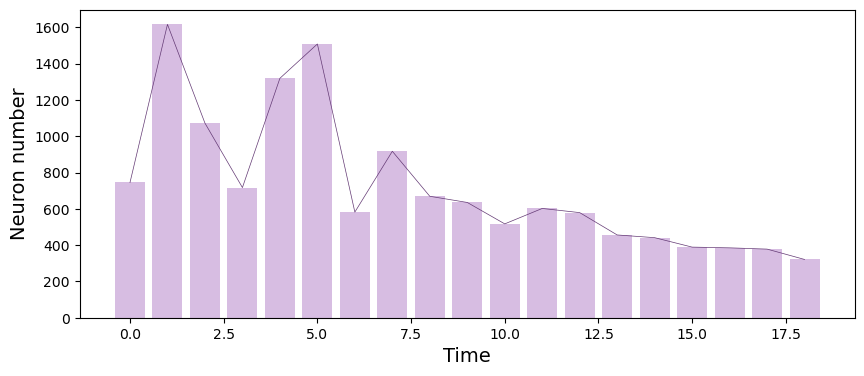

y: [0.09123222748815166, 0.11163770405476567, 0.1355976829910479, 0.12098472880463401, 0.11229594523433387, 0.09662980516061084, 0.08412322274881516, 0.07003686150605581, 0.05568720379146919, 0.04160084254870985, 0.031332280147446025, 0.022906793048973143, 0.012243285939968405, 0.00737230121116377, 0.0039494470774091624, 0.002369668246445498]


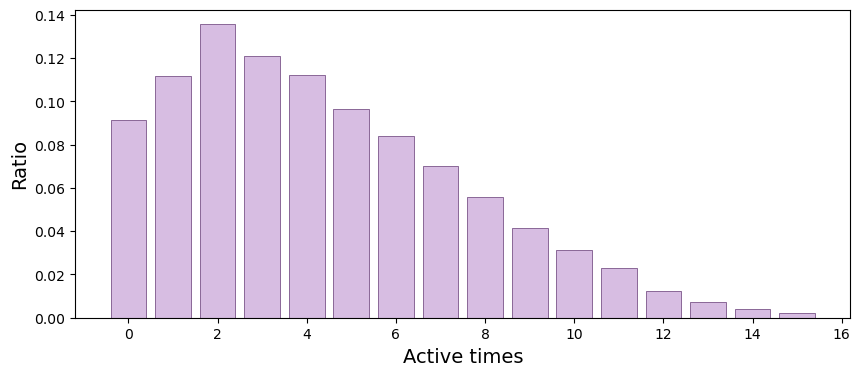

time 2296  -- selected neuron number: 745


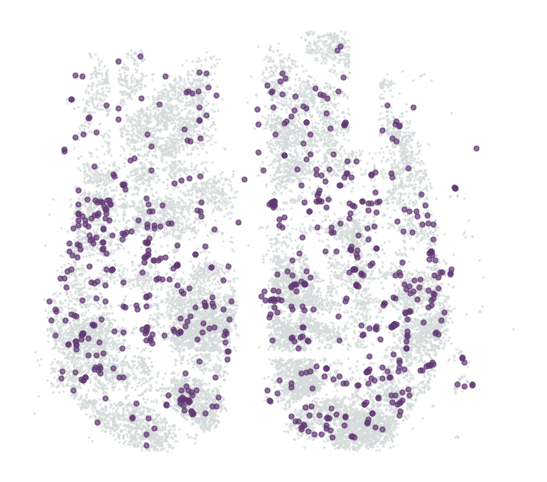

time 2330  -- selected neuron number: 1616


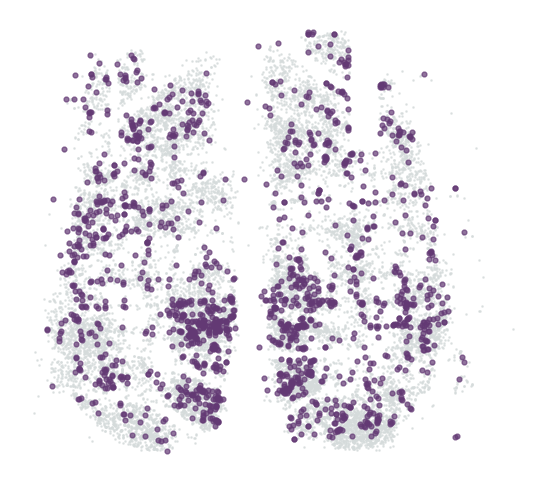

time 2358  -- selected neuron number: 1072


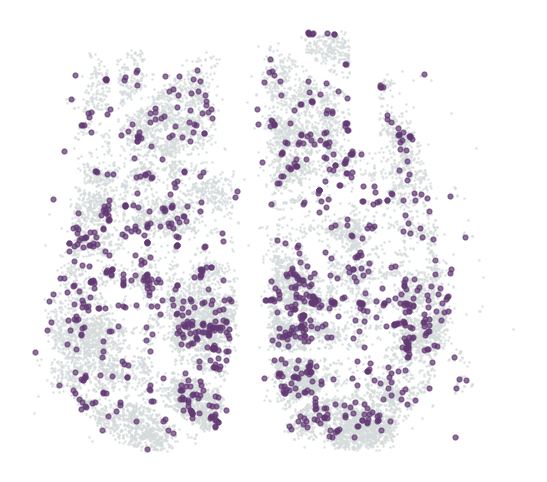

time 2396  -- selected neuron number: 717


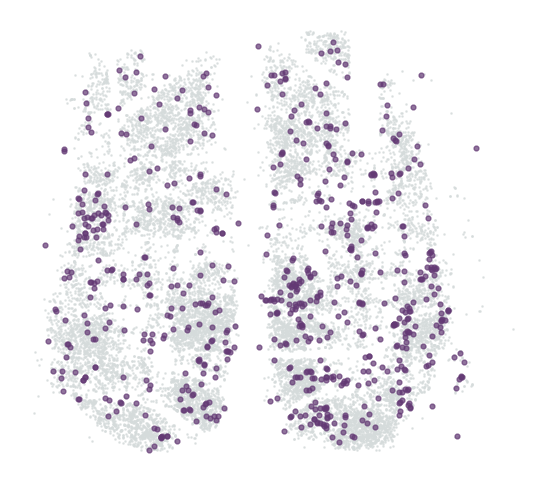

time 2439  -- selected neuron number: 1319


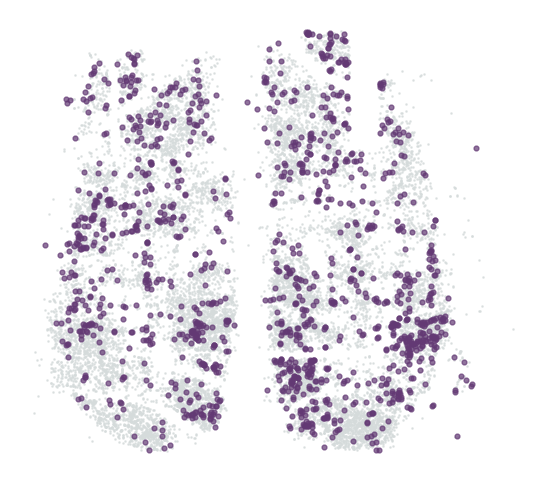

time 2475  -- selected neuron number: 1508


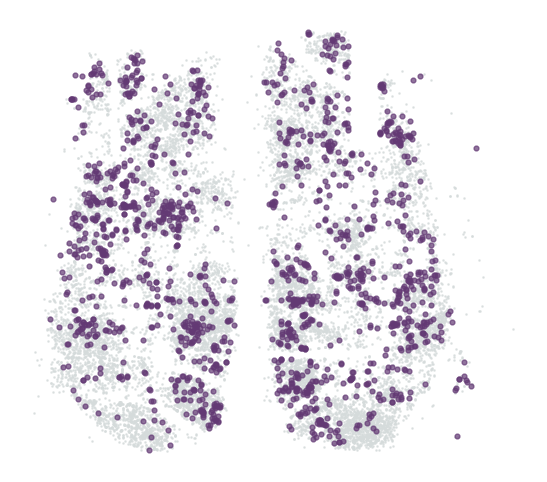

time 2526  -- selected neuron number: 582


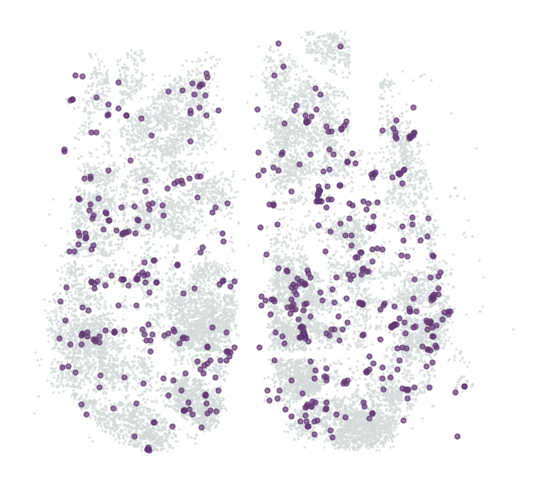

time 2656  -- selected neuron number: 917


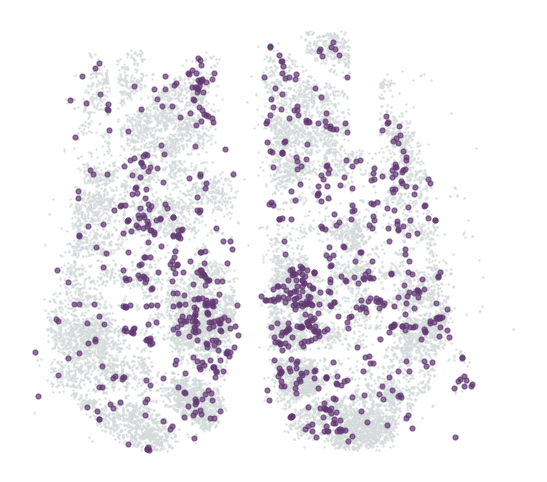

time 2746  -- selected neuron number: 669


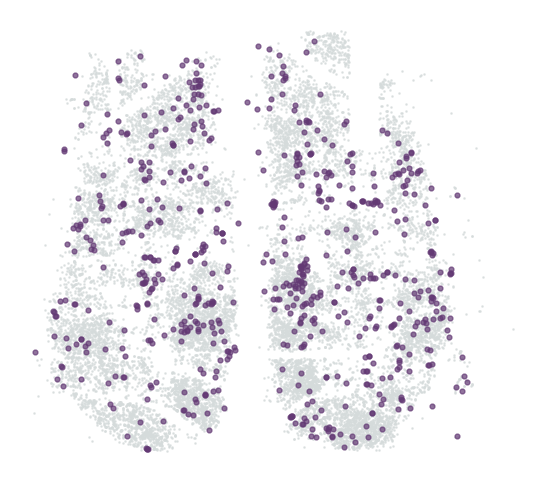

time 2846  -- selected neuron number: 635


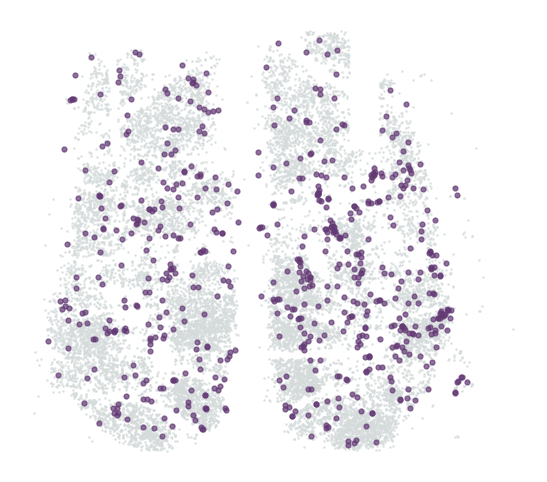

time 2976  -- selected neuron number: 517


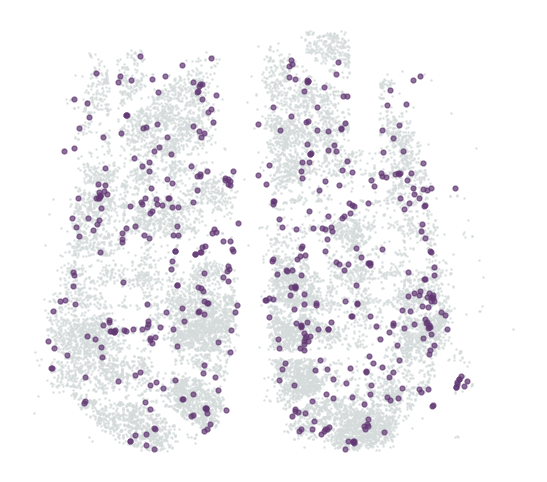

time 3036  -- selected neuron number: 602


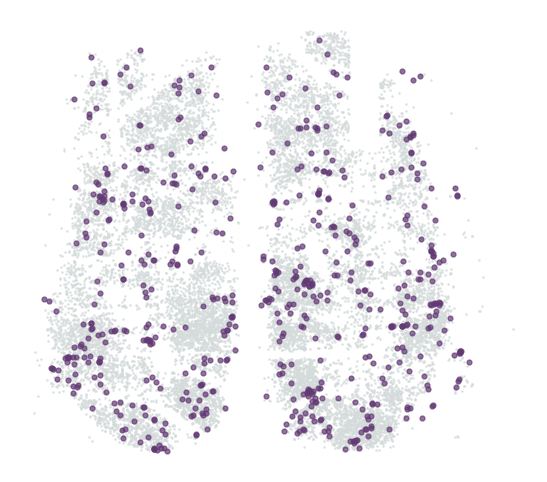

time 3096  -- selected neuron number: 579


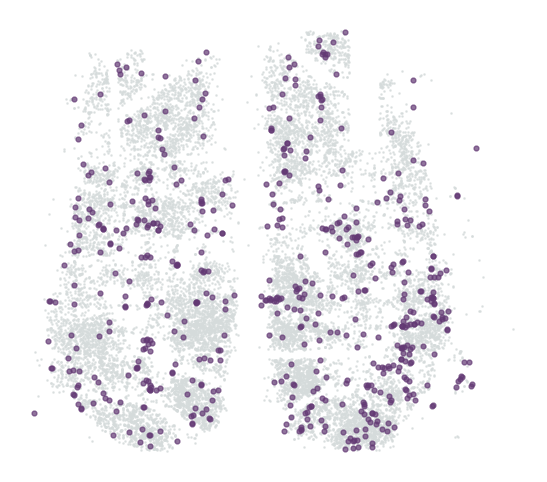

time 3196  -- selected neuron number: 456


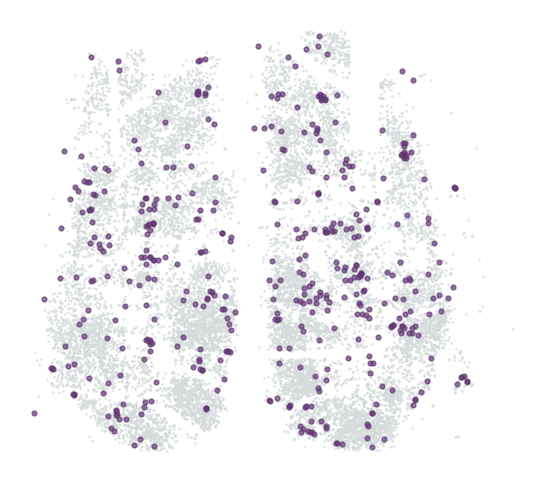

time 3256  -- selected neuron number: 441


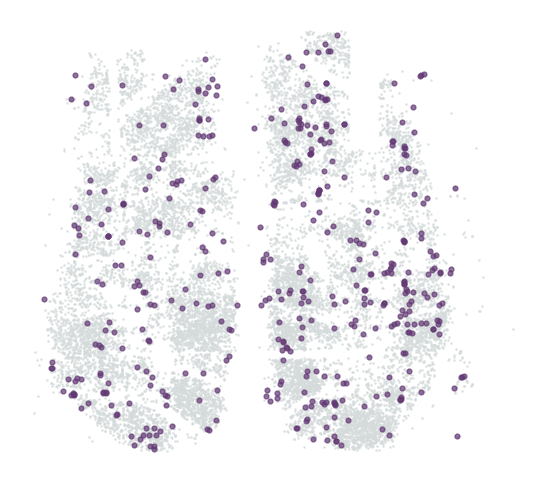

time 3316  -- selected neuron number: 389


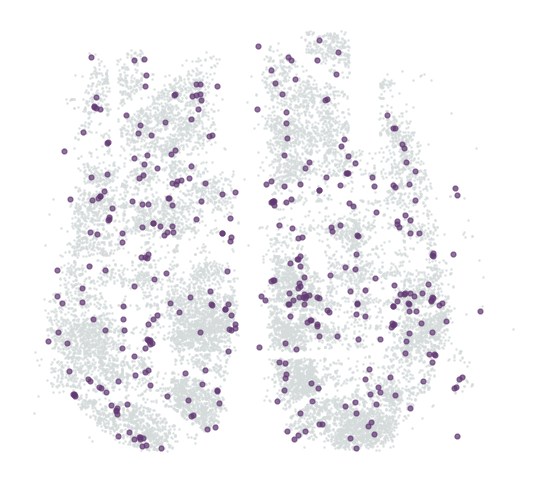

time 3446  -- selected neuron number: 385


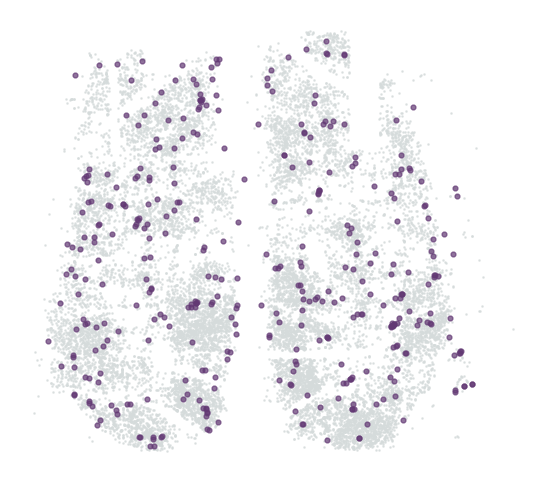

time 3616  -- selected neuron number: 378


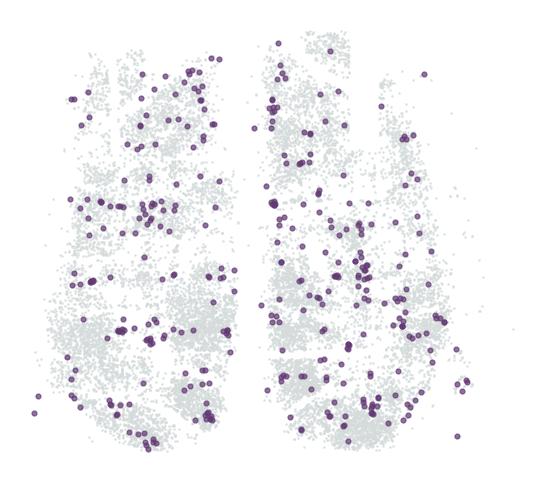

time 3716  -- selected neuron number: 321


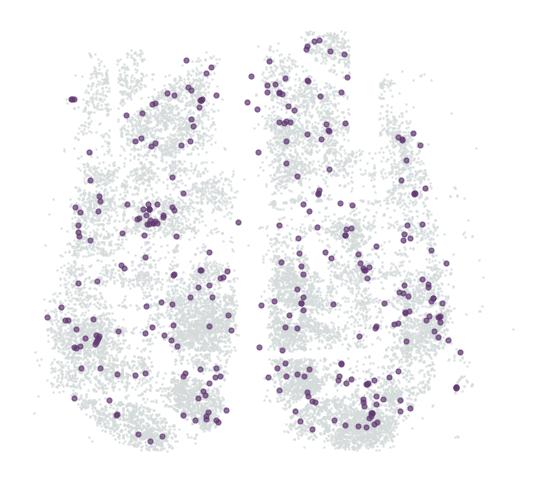

end


In [28]:
'''
statistics
'''

name = "supp"

## time evolution
bs_code_matrix_sum = np.sum(code_matrix, axis = 0)
bs_code_matrix_sum_bs = bs_code_matrix_sum[ane_time_idx]

x = range(len(bs_code_matrix_sum_bs))
fig,ax = plt.subplots(figsize=(10,4), dpi=100, facecolor="w")
plt.bar(x, bs_code_matrix_sum_bs, color = "#D7BDE2")
plt.plot(bs_code_matrix_sum_bs, "-", color = "#633974", linewidth = 0.5)
plt.xlabel("Time", fontsize = 14)
plt.ylabel("Neuron number", fontsize = 14)
plt.savefig(res_path + "neurons/neurons_active_code_selfAvg_only_" + name + ".pdf", bbox_inches='tight')
plt.show()


## active times
times_max = 16  ## change this parameter
code_matrix_type = np.sum(code_matrix, axis = 1)
code_matrix_type_cnt = []
for i in range(1, len(bs_code_matrix_sum_bs) + 1):
    cnt = list(code_matrix_type).count(i)
    code_matrix_type_cnt.append(cnt)

x = range(times_max)
y = [code_matrix_type_cnt[i] / sum(code_matrix_type_cnt) for i in range(times_max - 1)]
y.append(sum(code_matrix_type_cnt[times_max - 1:]) / sum(code_matrix_type_cnt))
print("y:", y)

fig,ax = plt.subplots(figsize=(10,4), dpi=100, facecolor="w")
plt.bar(x, y, color = "#D7BDE2", edgecolor = "#633974", linewidth = 0.5)
plt.ylabel("Ratio", fontsize = 14)
plt.xlabel("Active times", fontsize = 14)
# plt.xlim((-0.05, 650))
plt.savefig(res_path + "neurons/neurons_active_code_ratio_" + name + "_selfAvg.pdf", bbox_inches='tight')
plt.show()


## brain map 
cnt = 0
cnt_list = []
for start in ane_time_range:   
    select_data_ids = np.load(res_path + "neurons/neurons_ids_" + name + "_start" + str(start) + "_duration" + str(duration) + "_selfAvg_relax.npy")
    print("time", start, " -- selected neuron number:", len(select_data_ids))

    ## pos
    neurons_x_only = [valid_neuron_x[i] for i in select_data_ids]
    neurons_y_only = [valid_neuron_y[i] for i in select_data_ids]
    
    non_select_data_ids = [i for i in range(len(denoised_data)) if i not in select_data_ids]
    non_neurons_x = [valid_neuron_x[i] for i in non_select_data_ids]
    non_neurons_y = [valid_neuron_y[i] for i in non_select_data_ids]

    fig, ax = plt.subplots(figsize = (6.8, 6), dpi= 100,facecolor="w")
    plt.scatter(non_neurons_x, non_neurons_y, s = 0.8, c = "#D5DBDB", alpha = 0.7)
    plt.scatter(neurons_x_only, neurons_y_only, s = 12, c = "#633974", alpha = 0.7)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    plt.xticks([])
    plt.yticks([])
    plt.savefig(res_path + "neurons/neurons_map_" + name + "_start" + str(start) + "_duration" + str(duration) + "_selfAvg_relax.png", bbox_inches='tight')
    plt.show()
    
print("end")

only_bs_ids: 1270
bs_and_ane_ids: 5596
------------------ only-type neurons ----------------------


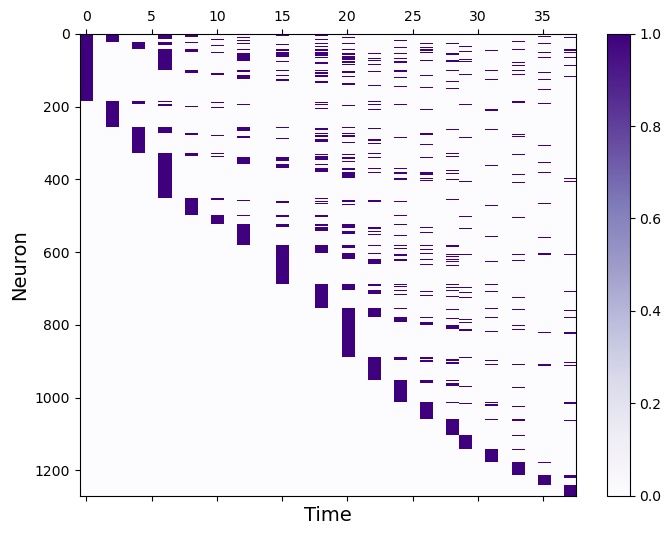

(1270,)


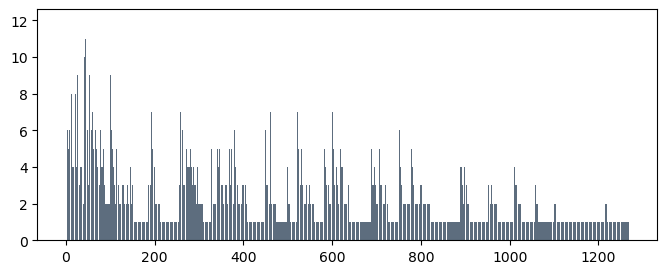

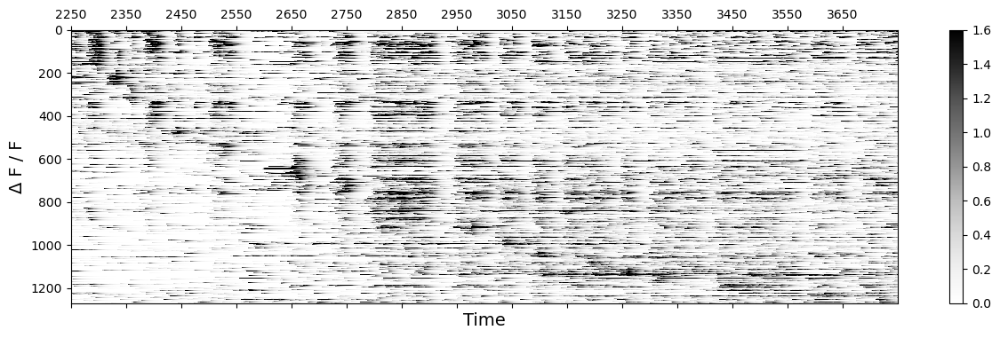

------------------ both-type neurons ----------------------


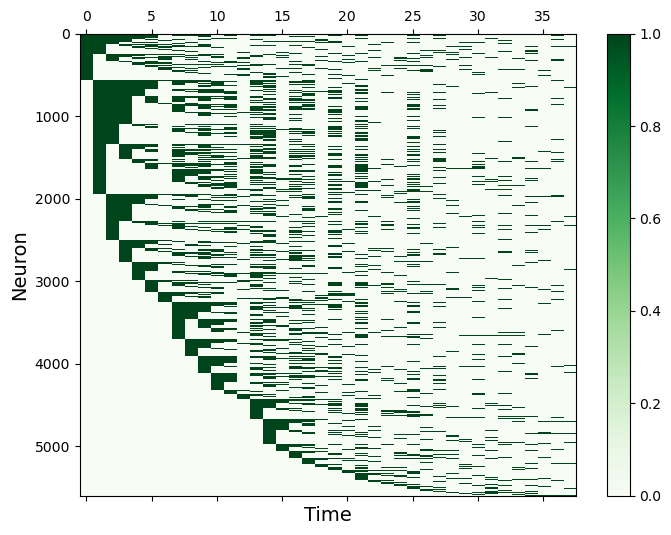

(5596,)


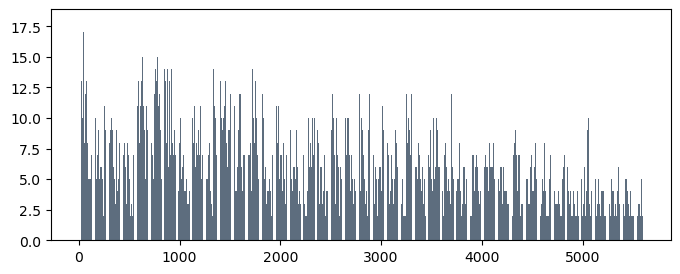

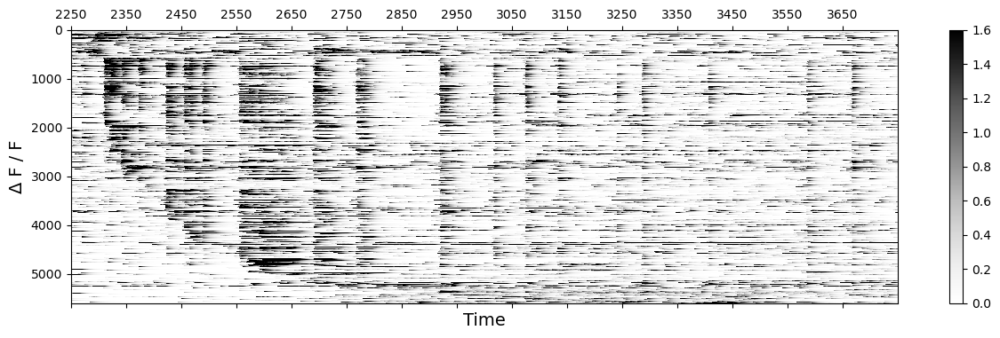

end


In [30]:
'''
detailed category
'''

name = "supp"

only_bs_ids = []
bs_and_ane_ids = []
for i in range(len(code_matrix)):
    active_idx = list(np.where(code_matrix[i] == 1)[0])
    ane_active_idx = list(set(active_idx) & set(ane_time_idx))
    bs_active_idx = list(set(active_idx) & set(bs_time_idx))
    if len(ane_active_idx) == 0:
        continue
    if len(bs_active_idx) == 0:
        only_bs_ids.append(i)
    else:
        bs_and_ane_ids.append(i)
print("only_bs_ids:", len(only_bs_ids)) 
print("bs_and_ane_ids:", len(bs_and_ane_ids))  

## only burst
print("------------------ only-type neurons ----------------------")
code_matrix_only_bs = code_matrix[only_bs_ids]
fig,ax = plt.subplots(figsize=(8,6), dpi=100, facecolor="w")
caxes = ax.matshow(code_matrix_only_bs, vmin = 0, vmax = 1, cmap = "Purples", aspect = "auto")
fig.colorbar(caxes)
plt.ylabel("Neuron", fontsize = 14)
plt.xlabel("Time", fontsize = 14)
plt.savefig(res_path + "neurons/active_code_sorted_only_" + name + ".pdf", bbox_inches='tight')
plt.show()

code_matrix_sum_only_bs = np.sum(code_matrix_only_bs, axis = 1)
print(code_matrix_sum_only_bs.shape)
x = range(len(code_matrix_sum_only_bs))
fig,ax = plt.subplots(figsize=(8,3), dpi=100, facecolor="w")
plt.bar(x, code_matrix_sum_only_bs,color = "#5D6D7E", width = 0.8)
plt.savefig(res_path + "neurons/active_times_only_" + name + ".pdf", bbox_inches='tight')
plt.show()

data_only_bs_ids = [select_data_ids_sort[i] for i in only_bs_ids]
calc_rec_only_bs = denoised_data[data_only_bs_ids, calc_start : calc_end]
fig,ax = plt.subplots(figsize=(15,4), dpi=100, facecolor="w")
caxes = ax.matshow(calc_rec_only_bs, vmin = 0, vmax = 1.6, cmap = "Greys", aspect = "auto")
fig.colorbar(caxes)
plt.xticks(np.arange(0, calc_end - calc_start, 100), np.arange(calc_start, calc_end, 100))
plt.ylabel("\u0394 F / F", fontsize = 14)
plt.xlabel("Time", fontsize = 14)
plt.savefig(res_path + "neurons/calc_trace_sorted_only_" + name + ".pdf", bbox_inches='tight')
plt.show()

np.save(res_path + "neurons/neurons_only_" + name + "_ids.npy", data_only_bs_ids)


## both burst and supp
print("------------------ both-type neurons ----------------------")
code_matrix_bs_ane = code_matrix[bs_and_ane_ids]
fig,ax = plt.subplots(figsize=(8,6), dpi=100, facecolor="w")
caxes = ax.matshow(code_matrix_bs_ane, vmin = 0, vmax = 1, cmap = "Greens", aspect = "auto")
fig.colorbar(caxes)
plt.ylabel("Neuron", fontsize = 14)
plt.xlabel("Time", fontsize = 14)
plt.savefig(res_path + "neurons/active_code_sorted_both_burst_supp.pdf", bbox_inches='tight')
plt.show()

code_matrix_sum_bs_ane = np.sum(code_matrix_bs_ane, axis = 1)
print(code_matrix_sum_bs_ane.shape)
x = range(len(code_matrix_sum_bs_ane))
fig,ax = plt.subplots(figsize=(8,3), dpi=100, facecolor="w")
plt.bar(x, code_matrix_sum_bs_ane,color = "#5D6D7E", width = 0.8)
plt.savefig(res_path + "neurons/active_times_both_burst_supp.pdf", bbox_inches='tight')
plt.show()

bs_ane_ids = [select_data_ids_sort[i] for i in bs_and_ane_ids]
calc_rec_bs_ane = denoised_data[bs_ane_ids, calc_start : calc_end]
# calc_rec = denoised_data[select_data_ids_sort, calc_start : calc_end]
# calc_rec_bs_ane = calc_rec[bs_and_ane_ids]
fig,ax = plt.subplots(figsize=(15,4), dpi=100, facecolor="w")
caxes = ax.matshow(calc_rec_bs_ane, vmin = 0, vmax = 1.6, cmap = "Greys", aspect = "auto")
fig.colorbar(caxes)
plt.xticks(np.arange(0, calc_end - calc_start, 100), np.arange(calc_start, calc_end, 100))
plt.ylabel("\u0394 F / F", fontsize = 14)
plt.xlabel("Time", fontsize = 14)
plt.savefig(res_path + "neurons/calc_trace_sorted_both_burst_supp.pdf", bbox_inches='tight')
plt.show()

np.save(res_path + "neurons/neurons_both_burst_supp_ids.npy", bs_ane_ids)

print("end")


code_matrix_only_bs_sum_bs: (19,)


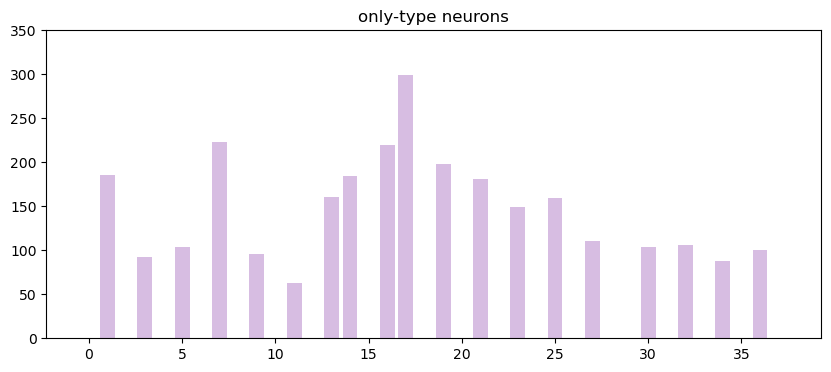

code_matrix_bs_ane_sum_bs_all: (38,)


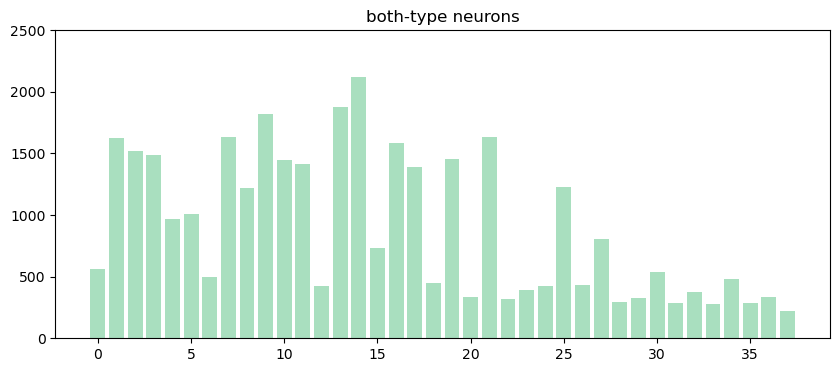

In [31]:
'''
further statistics
'''

## only-type neurons along time
code_matrix_only_bs_sum = np.sum(code_matrix_only_bs, axis = 0)
code_matrix_only_bs_sum_bs = code_matrix_only_bs_sum[ane_time_idx]
print("code_matrix_only_bs_sum_bs:", code_matrix_only_bs_sum_bs.shape)

data = [0] * len(bs_ane_time_range)
for i in range(len(ane_time_idx)):
    data[bs_time_idx[i]] = code_matrix_only_bs_sum_bs[i]
    
x = range(len(data))
fig,ax = plt.subplots(figsize=(10,4), dpi=100, facecolor="w")
plt.bar(x, data, color = "#D7BDE2")#, edgecolor = "#2471A3")
plt.ylim((0,350))
plt.title("only-type neurons")
plt.savefig(res_path + "neurons/neurons_active_code_selfAvg_only_supp.pdf", bbox_inches='tight')
plt.show()

## both-type neurons along time 
code_matrix_bs_ane_sum = np.sum(code_matrix_bs_ane, axis = 0)
code_matrix_bs_ane_sum_bs_all = code_matrix_bs_ane_sum
print("code_matrix_bs_ane_sum_bs_all:", code_matrix_bs_ane_sum_bs_all.shape)

x = range(len(code_matrix_bs_ane_sum_bs_all))
fig,ax = plt.subplots(figsize=(10,4), dpi=100, facecolor="w")
plt.bar(x, code_matrix_bs_ane_sum_bs_all, color = "#A9DFBF")#, edgecolor = "#2471A3")
plt.ylim((0,2500))
plt.title("both-type neurons")
plt.savefig(res_path + "neurons/neurons_active_code_selfAvg_both_burst_supp.pdf", bbox_inches='tight')
plt.show()

